# `ML Use Case Inclass_Tasks_Bonus_Marks`

In [2]:
# Import Necessary Libraries
from tensorflow import keras
from tensorflow.keras import layers
import pathlib
from tensorflow.keras.utils import image_dataset_from_directory

import pandas as pd
import pathlib
from pathlib import Path

import numpy as np
import pandas as pd


# Framing the Problem

Breast cancer is one of the leading causes of cancer-related deaths worldwide with the ***`Invasive Ductal Carcinoma (IDC)`*** being the most common type. Early detection is crucial for effective treatment and improved patient outcomes. However, current detection methods often lack accuracy and reliability. Our project aims to improve breast cancer detection using deep learning techniques

# Getting the data
The original dataset consisted of 162 whole mount slide images of Breast Cancer (BCa) specimens scanned at 40x. From that, 277,524 patches of size 50 x 50 were extracted (198,738 IDC negative and 78,786 IDC positive). Each patch’s file name is of the format: u_xX_yY_classC.png — > example 10253_idx5_x1351_y1101_class0.png . Where u is the patient ID (10253_idx5), X is the x-coordinate of where this patch was cropped from, Y is the y-coordinate of where this patch was cropped from, and C indicates the class where 0 is non-IDC and 1 is IDC.

In [4]:
data_folder = pathlib.Path("../../../../../Downloads/hispathology")

In [3]:
data_folder = pathlib.Path("./Datasets")

In [4]:
len(list(data_folder.glob('*')))

280

In [ ]:
# Install pHash Library
pip install imagehash


In [9]:
# load imagehash library
from PIL import Image
import imagehash


In [ ]:
# load the patch image
image = Image.open('..0/8863_idx5_x151_y1301_class0')


In [ ]:
phash_value = imagehash.phash(image)
print(phash_value)

In [ ]:
image1 = Image.open('8863_idx5_x151_y1301_class0')
image2 = Image.open('8863_idx5_x151_y1301_class1')

phash1 = imagehash.phash(image1)
phash2 = imagehash.phash(image2)

# Calculate the Hamming distance between the hashes
hash_difference = phash1 - phash2
print('Hamming Distance:', hash_difference)


In [7]:
patient_data_folder = data_folder / 'IDC_regular_ps50_idx5'

In [8]:
len(list(patient_data_folder.glob('*')))

279

In [9]:
patient_folders = [x for x in patient_data_folder.glob('*') if x.is_dir()]
patient_folders = [x.name for x in patient_folders]
patient_folders[:10]

['10253',
 '10254',
 '10255',
 '10256',
 '10257',
 '10258',
 '10259',
 '10260',
 '10261',
 '10262']

In [10]:
total_images = 0
for patient_folder in patient_folders:
    patient_folder_path = patient_data_folder / patient_folder
    subfolders = ['0', '1']  # List of subfolders you're interested in
    for subfolder in subfolders:
        subfolder_path = patient_folder_path / subfolder
        images = list(subfolder_path.glob('*'))
        total_images += len(images)
        print(f'Patient folder {patient_folder}/{subfolder} contains {len(images)} images.')


Patient folder 10253/0 contains 479 images.
Patient folder 10253/1 contains 70 images.
Patient folder 10254/0 contains 772 images.
Patient folder 10254/1 contains 76 images.
Patient folder 10255/0 contains 181 images.
Patient folder 10255/1 contains 91 images.
Patient folder 10256/0 contains 351 images.
Patient folder 10256/1 contains 117 images.
Patient folder 10257/0 contains 427 images.
Patient folder 10257/1 contains 208 images.
Patient folder 10258/0 contains 422 images.
Patient folder 10258/1 contains 108 images.
Patient folder 10259/0 contains 1434 images.
Patient folder 10259/1 contains 31 images.
Patient folder 10260/0 contains 928 images.
Patient folder 10260/1 contains 361 images.
Patient folder 10261/0 contains 590 images.
Patient folder 10261/1 contains 56 images.
Patient folder 10262/0 contains 1053 images.
Patient folder 10262/1 contains 754 images.
Patient folder 10264/0 contains 617 images.
Patient folder 10264/1 contains 587 images.
Patient folder 10268/0 contains 208

Patient folder 10305/0 contains 1802 images.
Patient folder 10305/1 contains 19 images.
Patient folder 10306/0 contains 751 images.
Patient folder 10306/1 contains 273 images.
Patient folder 10307/0 contains 915 images.
Patient folder 10307/1 contains 80 images.
Patient folder 10308/0 contains 1383 images.
Patient folder 10308/1 contains 895 images.
Patient folder 12241/0 contains 37 images.
Patient folder 12241/1 contains 115 images.
Patient folder 12242/0 contains 668 images.
Patient folder 12242/1 contains 429 images.
Patient folder 12626/0 contains 1088 images.
Patient folder 12626/1 contains 254 images.
Patient folder 12748/0 contains 168 images.
Patient folder 12748/1 contains 198 images.
Patient folder 12749/0 contains 1199 images.
Patient folder 12749/1 contains 563 images.
Patient folder 12750/0 contains 1413 images.
Patient folder 12750/1 contains 21 images.
Patient folder 12751/0 contains 849 images.
Patient folder 12751/1 contains 967 images.
Patient folder 12752/0 contains

In [11]:
print(f'Total number of images in all subfolders is {total_images}.')

Total number of images in all subfolders is 277524.


In [12]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.image import imread  # or from PIL import Image if you prefer


# Exploratory Data Analysis - Breast Cancer Detection

In [15]:
dataset.target.value_counts()

target
0    198738
1     78786
Name: count, dtype: int64

In [16]:
import plotly.graph_objects as go

# Calculate the percentage of cancerous patches for each patient
cancer_perc = dataset.groupby("patient_id")['target'].value_counts(normalize=True).unstack()

# Number of patches per patient
patches_per_patient = dataset.groupby("patient_id").size()

# Plot 1: Histogram of the number of patches per patient
fig1 = go.Figure(go.Histogram(x=patches_per_patient, nbinsx=30, marker_color="steelblue"))
fig1.update_layout(title_text="How many patches do we have per patient?", xaxis_title="Number of Patches", yaxis_title="Frequency", height=600, width=800)
fig1.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig1.show()

# Plot 2: Histogram of the percentage of cancerous patches per patient
# Ensure there is a '1' column for cancerous patches; if not, create it with 0 values
if 1 not in cancer_perc.columns:
    cancer_perc[1] = 0
fig2 = go.Figure(go.Histogram(x=cancer_perc[1], nbinsx=30, marker_color="mediumseagreen"))
fig2.update_layout(title_text="How much percentage of an image is covered by IDC?", xaxis_title="% of Patches with IDC", yaxis_title="Frequency", height=600, width=800)
fig2.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig2.show()

# Plot 3: Count plot of non-cancerous vs. cancerous patches
fig3 = go.Figure(go.Histogram(x=dataset['target'], nbinsx=2, marker_color=["darkorchid", "darkorange"]))
fig3.update_layout(title_text="How many patches show IDC?", xaxis_title="No (0) vs Yes (1)", yaxis_title="Count", height=600, width=800)
fig3.update_traces(marker_line_width=1, marker_line_color="black", opacity=0.8)
fig3.show()


## Examining the Patches

In [17]:
healthy = np.random.choice(dataset[dataset.target==0].index.values, size=50, replace=False)
non_healthy = np.random.choice(dataset[dataset.target==1].index.values, size=50, replace=False)


Healthy Patches

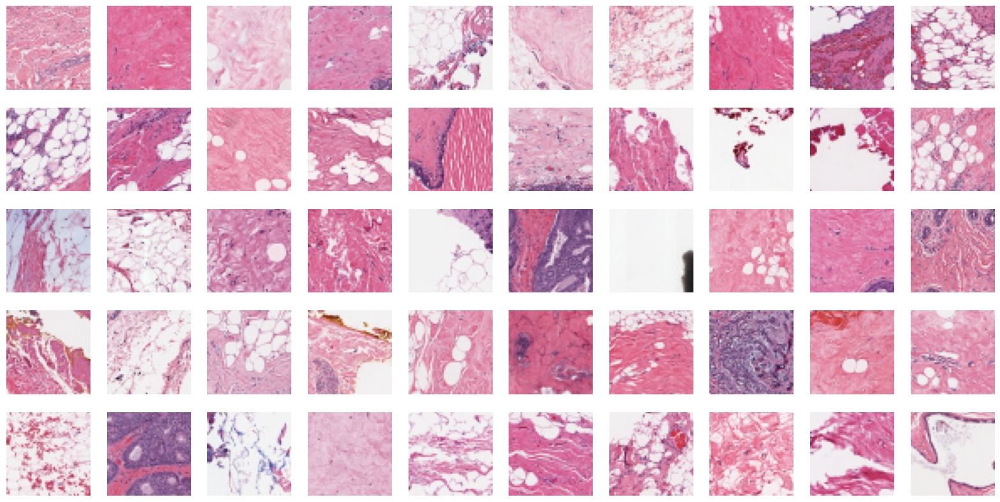

In [18]:

fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = healthy[m + 10*n]  # Index of the sample to display
        image_path = dataset.loc[idx, "path"]  # Get the path of the image
        image = imread(image_path)  # Load the image
        ax[n, m].imshow(image)  # Display the image
        ax[n, m].axis('off')  # Hide the axes

plt.show()

## Cancer Patches

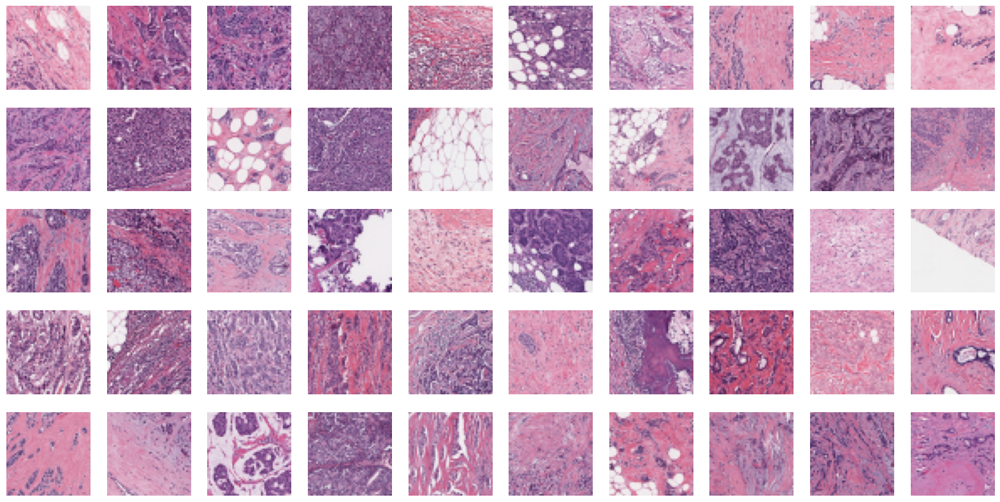

In [19]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = non_healthy[m + 10*n]  # Index of the sample to display
        image_path = dataset.loc[idx, "path"]  # Get the path of the image
        image = imread(image_path)  # Load the image
        ax[n, m].imshow(image)  # Display the image
        ax[n, m].axis('off')  # Hide the axes

plt.show()

# Exploratory Data Analysis - Breast Cancer Detection

## Data Loading
- Total number of images: 277,524
- Image dimensions: 50x50 pixels
- Labels: IDC (Invasive Ductal Carcinoma) and non-IDC
- Total number of image per patient

## Brief Conclusion
- This is still work in progress for the ML Use Case. We will continue to build on this.

# `Next Tasks on EDA`
## Class Distribution

## Data Visualization

## Feature Extraction